# Pokemon GAN

In [1]:
# импортируем необходимые модули
import os
import zipfile
import cv2
import matplotlib.pyplot as plt
import torch.utils.data
import torchvision.datasets as dset
import argparse
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML
%matplotlib inline

In [2]:
# ячейка для задания глобальных констант (гиперпараметры, пути к файлам) 
# пути для визуалиции фото из датасета
demo_img_1 = '/content/images/Amaura/1.jpg'
demo_img_2 = '/content/images/Obstagoon/0.jpg'
demo_img_3 = '/content/images/Vespiquen/1.jpg'
ROOT_DIR = 'images'
RESIZE_PARAM = 64
BATCH_SIZE = 128
NUM_WORKERS = 4
DEVICE = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
IN_CHANNELS = 3
#-----------------------------------------
DISCRIM_FEATURE_MAP = 64
DISCRIM_KERNAL_SIZE = 4
DISCRIM_STRIDE = 2
DISCRIM_PADDING = 1
#-----------------------------------------
GENERATOR_LATENT_VECTOR_INPUT = 100
GENERATOR_FEATURE_MAP = 64
GENERATOR_KERNAL_SIZE = 4
GENERATOR_STRIDE = 2
GENERATOR_PADDING = 1
#-----------------------------------------
N_EPOCHS = 250
LEARNING_RATE = 0.0002

In [3]:
# скачиваем датасет с kaggle и разархивируем его
os.environ['KAGGLE_USERNAME'] = "alexeysoldatov"
os.environ['KAGGLE_KEY'] = "1e20f71d181a9b7c65ba76d99284592f"
! kaggle datasets download -d hlrhegemony/pokemon-image-dataset
zip = zipfile.ZipFile('pokemon-image-dataset.zip')
zip.extractall()

 80% 46.0M/57.9M [00:00<00:00, 132MB/s] 
100% 57.9M/57.9M [00:00<00:00, 103MB/s]


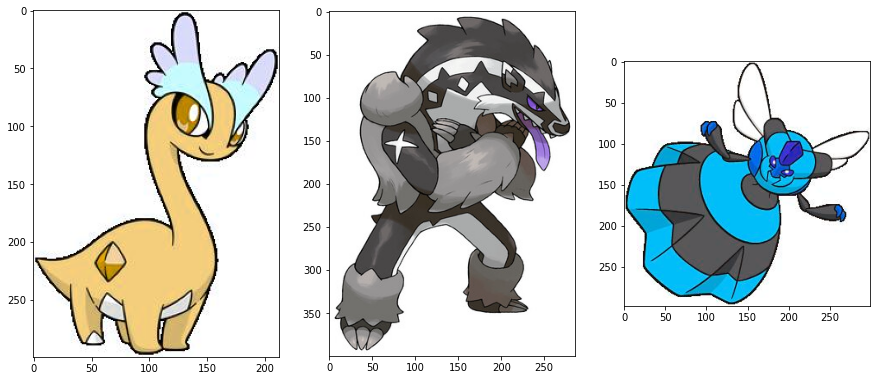

In [4]:
# посмотрим как выглядят фотографии нашего датасета
fig, (ax1, ax2, ax3) = plt.subplots(1,3)
fig.set_figheight(15)
fig.set_figwidth(15)
img_1 = cv2.imread(demo_img_1)
img_2 = cv2.imread(demo_img_2)
img_3 = cv2.imread(demo_img_3)
im1 = ax1.imshow(img_1)
im2 = ax2.imshow(img_2)
img3 = ax3.imshow(img_3)
plt.show()

In [5]:
# посчитаем среднее средних и стандартных отклонений по датасету для дальнейшей нормализации
mean_list_vals = [[], [], []]
std_list_vals = [[], [], []]
transform = transforms.Compose([
    transforms.ToTensor()
])
for top, dirs, files in os.walk('/content/images/'):
    for nm in files:       
      cur_img = cv2.imread(os.path.join(top, nm))
      img_tr = transform(cur_img)
      mean, std = img_tr.mean([1,2]), img_tr.std([1,2])
      mean_list_vals[0].append(mean[0].item())
      mean_list_vals[1].append(mean[1].item())
      mean_list_vals[2].append(mean[2].item())
      std_list_vals[0].append(std[0].item())
      std_list_vals[1].append(std[1].item())
      std_list_vals[2].append(std[2].item())

mean_of_means_imgs = np.array([sum(mean_list_vals[0]) / len(mean_list_vals[0]), sum(mean_list_vals[1]) / len(mean_list_vals[1]), sum(mean_list_vals[2]) / len(mean_list_vals[2])])
mean_of_stds_imgs = np.array([sum(std_list_vals[0]) / len(std_list_vals[0]), sum(std_list_vals[1]) / len(std_list_vals[1]), sum(std_list_vals[2]) / len(std_list_vals[2])])
print('mean_of_means_imgs', mean_of_means_imgs)
print('mean_of_stds_imgs', mean_of_stds_imgs)

mean_of_means_imgs [0.76482076 0.78675993 0.79930566]
mean_of_stds_imgs [0.29510629 0.2809207  0.2811889 ]


В ходе экспериментов оказалось, что самы реалистичные покемоны получаются при дефолтной нормализации transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), улучшить их качество кастомными значениями не удалось((

In [6]:
# считывание и подготовка датасета 
pokemon_dataset = dset.ImageFolder(root=ROOT_DIR,
                           transform=transforms.Compose([
                               transforms.Resize(RESIZE_PARAM), # делаем самую короткую сторону изображения равной RESIZE_PARAM, другая сторона будет отмасштабирована автоматически
                               transforms.CenterCrop(RESIZE_PARAM), # обрезаем центр изображения, чтобы сделать его квадратным
                               transforms.ToTensor(), # переводим в тензор
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), # нормализуем наши фото
                           ]))
# создаем dataloader
dataloader = torch.utils.data.DataLoader(pokemon_dataset, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=NUM_WORKERS)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [7]:
# напишем класс дискриминатора
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(IN_CHANNELS, DISCRIM_FEATURE_MAP, DISCRIM_KERNAL_SIZE, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(DISCRIM_FEATURE_MAP, DISCRIM_FEATURE_MAP * 2, DISCRIM_KERNAL_SIZE, DISCRIM_STRIDE, DISCRIM_PADDING, bias=False),
            nn.BatchNorm2d(DISCRIM_FEATURE_MAP * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(DISCRIM_FEATURE_MAP * 2, DISCRIM_FEATURE_MAP * 4, DISCRIM_KERNAL_SIZE, DISCRIM_STRIDE, DISCRIM_PADDING, bias=False),
            nn.BatchNorm2d(DISCRIM_FEATURE_MAP * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(DISCRIM_FEATURE_MAP * 4, DISCRIM_FEATURE_MAP * 8, DISCRIM_KERNAL_SIZE, DISCRIM_STRIDE, DISCRIM_PADDING, bias=False),
            nn.BatchNorm2d(DISCRIM_FEATURE_MAP * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(DISCRIM_FEATURE_MAP * 8, 1, DISCRIM_KERNAL_SIZE, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# напишем класс генератора
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(GENERATOR_LATENT_VECTOR_INPUT, GENERATOR_FEATURE_MAP * 8, GENERATOR_KERNAL_SIZE, 1, 0, bias=False),
            nn.BatchNorm2d(GENERATOR_FEATURE_MAP * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(GENERATOR_FEATURE_MAP * 8, GENERATOR_FEATURE_MAP * 4, GENERATOR_KERNAL_SIZE, GENERATOR_STRIDE, GENERATOR_PADDING, bias=False),
            nn.BatchNorm2d(GENERATOR_FEATURE_MAP * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(GENERATOR_FEATURE_MAP * 4, GENERATOR_FEATURE_MAP * 2, GENERATOR_KERNAL_SIZE, GENERATOR_STRIDE, GENERATOR_PADDING, bias=False),
            nn.BatchNorm2d(GENERATOR_FEATURE_MAP * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(GENERATOR_FEATURE_MAP * 2, GENERATOR_FEATURE_MAP, GENERATOR_KERNAL_SIZE, GENERATOR_STRIDE, GENERATOR_PADDING, bias=False),
            nn.BatchNorm2d(GENERATOR_FEATURE_MAP),
            nn.ReLU(True),
            nn.ConvTranspose2d(GENERATOR_FEATURE_MAP, IN_CHANNELS, GENERATOR_KERNAL_SIZE, GENERATOR_STRIDE, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Создадим объекты классов генератора и дискриминатора
my_generator = Generator().to(DEVICE)
my_discriminator = Discriminator().to(DEVICE)

In [10]:
my_generator

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [11]:
my_discriminator

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

За основу для обучения модели была взята статья с официального tutorial PyTorch
https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html


In [24]:
# класс для обучения модели
class Fitter(object):
    def __init__(self, generator, discriminator, batch_size, n_epochs, latent_dim, lr):
        
        self.generator = generator
        self.discriminator = discriminator
        self.batch_size = batch_size
        self.n_epochs = n_epochs
        self.latent_dim = latent_dim
        self.lr = lr
        self.opt_gen  = torch.optim.RMSprop(self.generator.parameters(), lr=self.lr)
        self.opt_disc = torch.optim.RMSprop(self.discriminator.parameters(), lr=self.lr)
        self.real_label = 1
        self.fake_label = 0
        self.criterion = nn.BCELoss()

        self.generator.to(DEVICE)
        self.discriminator.to(DEVICE)
        self.fixed_noise = torch.randn(64, GENERATOR_LATENT_VECTOR_INPUT, 1, 1, device=DEVICE)
    
    def fit(self, dataloader):
        
        # включаем обучение
        self.generator.train(True)
        self.discriminator.train(True)
        img_list, G_losses, D_losses = [], [], []
        iters = 0
        for epoch in range(N_EPOCHS): # обучаемся конкретно заданное число эпох
            for i, data in enumerate(dataloader, 0): # проходимся по всем батчам в даталоадере
                my_discriminator.zero_grad() # устанавливаем все градиенты тензоров дискриминатора в 0
                real_cpu = data[0].to(DEVICE) # переводим на gpu если есть возможность
                b_size = real_cpu.size(0)
                label = torch.full((b_size,), self.real_label, device=DEVICE, dtype=torch.float32) # заполняем единичками массив меток
                output = my_discriminator(real_cpu).view(-1) # делаем прямой проход изображения из обучающей выборки через дискриминатор
                errD_real = self.criterion(output, label) # считаем лосс дискриминатора на реальных объектах
                errD_real.backward() # считаем градиеты при обратном проходе по дискриминатору на реальных объектах
                D_x = output.mean().item()
                # далее на вход будем подавать фейковые батчи данных
                noise = torch.randn(b_size, GENERATOR_LATENT_VECTOR_INPUT, 1, 1, device=DEVICE) # генерируем батч скрытого вектора с рандомным шумом
                fake = my_generator(noise) # генерируем генератором изображение из шума
                label.fill_(self.fake_label)
                output = my_discriminator(fake.detach()).view(-1) # классифициуем дискриминатором сгенерированные фейковые изображения 
                errD_fake = self.criterion(output, label) # считаем лосс дискриминатора на фейковых объектах
                errD_fake.backward() # считаем градинеты при обратном проходе по дискриминатору на фейковых объектах
                D_G_z1 = output.mean().item()
                errD = errD_real + errD_fake # складываем градиенты ошибок дискриминатора на реальных и фейковых объектах
                self.opt_disc.step() # обновляем (делаем шаг дискриминатора)

                # далее будем обновлять веса генератора, максимизируя log(D(G(z)))
                my_generator.zero_grad() # устанавливаем все градиенты тензоров генератора в 0
                label.fill_(self.real_label) # фейковые метки считаются реальными для генератора
                output = my_discriminator(fake).view(-1) # после обновления весов дискриминатора пропускаем через него опять батч фейковых объектов
                errG = self.criterion(output, label) # считаем лосс генератора на том, что сгененрировал дискриминатор из фейковых объектов после обновления весов
                errG.backward() # считаем градиеты при обратном проходе по генератору
                D_G_z2 = output.mean().item()
                self.opt_gen.step() # обновляем веса генератора
                
                # каждые 50 батчей выводим информацию о процессе обучения
                if i % 50 == 0:
                    print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                          % (epoch, N_EPOCHS, i, len(dataloader),
                            errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
                
                # сохраняем ошибки
                G_losses.append(errG.item())
                D_losses.append(errD.item())

                # проверяем как работает генератор на фиксированном шуме (чему он научился)
                if (iters % 500 == 0) or ((epoch == N_EPOCHS-1) and (i == len(dataloader)-1)):
                    with torch.no_grad():
                        fake = my_generator(self.fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
                    
                iters += 1
        return img_list, G_losses, D_losses           

In [25]:
model = Fitter(my_generator, my_discriminator, batch_size=BATCH_SIZE, n_epochs=N_EPOCHS, 
                latent_dim=GENERATOR_LATENT_VECTOR_INPUT, lr=LEARNING_RATE)
img_list, G_losses, D_losses = model.fit(dataloader)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[0/250][0/20]	Loss_D: 0.0455	Loss_G: 7.8343	D(x): 0.9837	D(G(z)): 0.0251 / 0.0210
[1/250][0/20]	Loss_D: 0.1268	Loss_G: 4.3919	D(x): 0.9629	D(G(z)): 0.0781 / 0.0172
[2/250][0/20]	Loss_D: 0.2572	Loss_G: 2.7668	D(x): 0.9276	D(G(z)): 0.1570 / 0.0755
[3/250][0/20]	Loss_D: 0.6534	Loss_G: 5.8724	D(x): 0.9891	D(G(z)): 0.3913 / 0.0073
[4/250][0/20]	Loss_D: 0.5019	Loss_G: 0.9147	D(x): 0.6658	D(G(z)): 0.0119 / 0.4652
[5/250][0/20]	Loss_D: 0.0968	Loss_G: 3.5563	D(x): 0.9677	D(G(z)): 0.0591 / 0.0387
[6/250][0/20]	Loss_D: 0.0713	Loss_G: 4.1774	D(x): 0.9655	D(G(z)): 0.0331 / 0.0281
[7/250][0/20]	Loss_D: 0.2669	Loss_G: 2.4744	D(x): 0.8570	D(G(z)): 0.0896 / 0.1009
[8/250][0/20]	Loss_D: 1.1764	Loss_G: 0.7174	D(x): 0.4058	D(G(z)): 0.0071 / 0.5336
[9/250][0/20]	Loss_D: 0.3631	Loss_G: 3.5543	D(x): 0.9100	D(G(z)): 0.2131 / 0.0396
[10/250][0/20]	Loss_D: 0.4206	Loss_G: 3.1465	D(x): 0.9182	D(G(z)): 0.2638 / 0.0554
[11/250][0/20]	Loss_D: 0.3270	Loss_G: 2.8823	D(x): 0.8820	D(G(z)): 0.1638 / 0.0720
[12/250][0/20]

In [29]:
# сохранение весов
torch.save(my_generator.state_dict(), 'pokemon_generator_model_weights.pth')

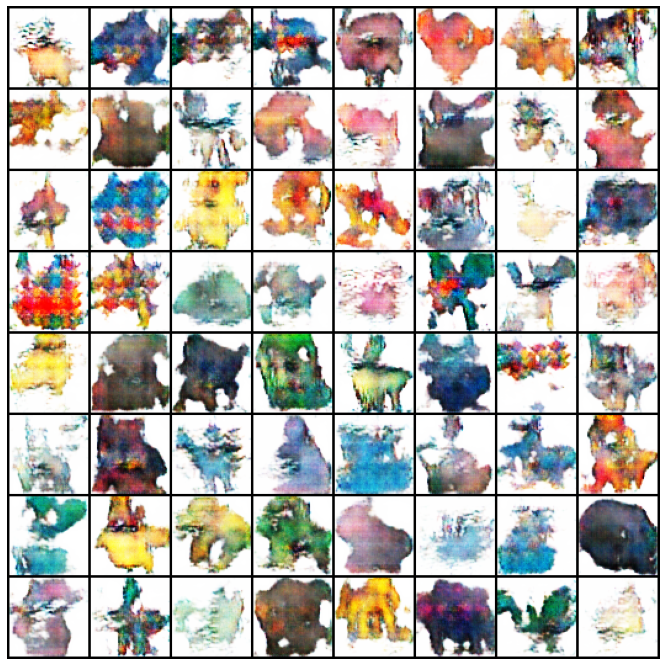

In [27]:
fig = plt.figure(figsize=(12,12))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Генерация изображений по обученному генератору

In [30]:
# загрузим веса и сгенерируем покемонов
!pip install -q gdown
!gdown https://drive.google.com/uc?id=1ICFFxfYLfhOmdA4rI2wJwiMPCjxn14mM

Downloading...
From: https://drive.google.com/uc?id=1ICFFxfYLfhOmdA4rI2wJwiMPCjxn14mM
To: /content/pokemon_generator_model_weights_final.pth
100% 14.3M/14.3M [00:00<00:00, 27.5MB/s]


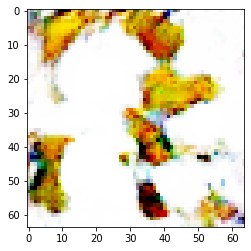

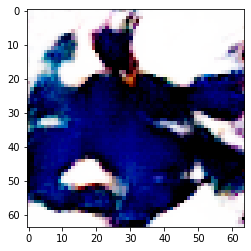

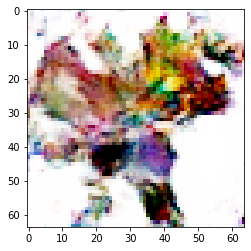

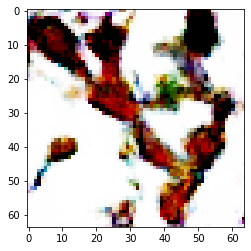

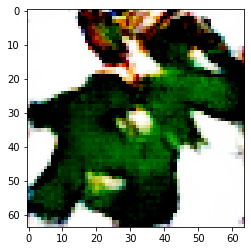

In [32]:
my_generator.load_state_dict(torch.load('/content/pokemon_generator_model_weights_250_default.pth'))
my_generator.eval()
with torch.no_grad():
  fixed_noise = torch.randn(RESIZE_PARAM, GENERATOR_LATENT_VECTOR_INPUT, 1, 1, device=DEVICE)
  generated_images = my_generator(fixed_noise)
for i in range(5):
  final_img = np.transpose(generated_images[i].to('cpu'), (1, 2, 0))
  plt.imshow(final_img)
  plt.show()

# Выводы
Качество генерации оставляет желать лучшего, однако на сгенерированных картинках уже вырисовываются четкие линии, котнуры, а не просто беспорядочный шум. Возможные пути улучшения качества генерации могут быть следующие: 

1) Сделать более граммотную предобработку исходных данных, сделать их более универсальными и понятными нейросети для обучения.

2) Перебор гиперпараметров модели, работа с внутренними слоями дискриминатора и генератора, использование других функций активаций, другой размер ядер свертки.

3) Использование другого оптимизатора (однако различия между Adam и RMSProp были не большими)

4) Обучаться на большем числе эпох

Был проведен эксперимент по добавлению sheduler для адаптивного learning rate в тандеме с momentum (оптимизатор импульса), однако в этом случае на сгенерированных картинках был хаотичный шум. Возможно это произошло из-за некорректных значений гиперпараметров данных двух параметров, необходим более тщательный перебор.
